# Лабораторная работа: кластеризация

---

## Разделение изображения на семантические компоненты

Загрузите изображение

In [1]:
from scipy.misc import imshow
from skimage.transform import resize
import imageio
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import time
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering, KMeans

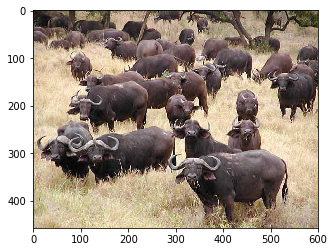

In [2]:
bizon = imageio.imread('data/bizon.jpg')
fig = plt.figure()
plt.imshow(bizon)

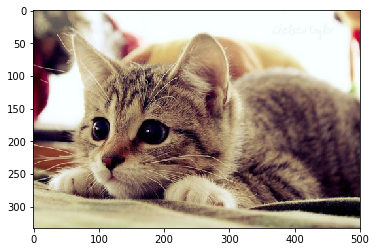

In [3]:
meow = imageio.imread('data/meow.jpg')
fig = plt.figure()
plt.imshow(meow)

---

**1. (1 балл)** На каждом изображении, используя кластеризацию KMeans, выделите компоненты, охарактеризовав каждый пиксель следующим образом [$\lambda x_i,\lambda y_i,r_i,g_i,b_i$], где $x_i$ и $y_i$ — координаты пикселя, $r_i$,$g_i$,$b_i$ — его цвет, $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.
 
**2. (0.5 балл)** Визуализируйте результаты сегментации.

In [4]:
def encode_pixels(l, image):
    pixels = []
    h, w, _ = image.shape
    for i in range(h):
        for j in range(w):
            r = image[i][j][0]
            g = image[i][j][1]
            b = image[i][j][2]
            pixel = (l*j,l*i, r, g, b)
            pixels.append(pixel)
    
    return pixels     

In [5]:
def km_cluster(img, L=0.5, n_clusters=3):
    encoded = encode_pixels(L, img)
    kmeans = KMeans(n_clusters=n_clusters, random_state=1).fit(encoded)
    labels = kmeans.labels_
    labels = labels.reshape((img.shape[0], img.shape[1]))
    
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    for l in range(n_clusters):
        plt.contour(labels == l, colors=[plt.cm.spectral(l / float(n_clusters))])
        plt.xticks(())
        plt.yticks(())
        title = 'Params: lambda={}, n_clusters={}'.format(L, n_clusters)
        plt.title(title)
    plt.show()

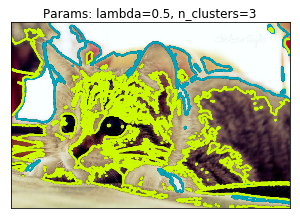

In [6]:
km_cluster(meow)

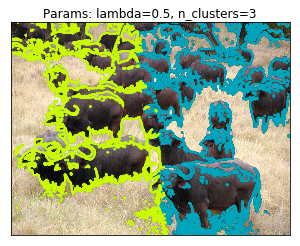

In [7]:
km_cluster(bizon)

---

**3. (1 балл)** 
Выделите сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html). Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету.
 
**4. (0.5 балл)** Визуализируйте результаты сегментации (аналогично рисунку выше).

Установим pyamg для ускорения кластеризации (можно пропустить, если уже имеется):

In [115]:
# Install a pip package in the current Jupyter kernel
import sys
!{sys.executable} -m pip install pyamg

    100% |████████████████████████████████| 778kB 1.1MB/s ta 0:00:01
  Running setup.py bdist_wheel for pyamg ... done
  Stored in directory: /Users/miron/Library/Caches/pip/wheels/6f/e7/a0/4b6ebf61e3226acbe45787171a084091cb7990307a4931691a
Successfully built pyamg
You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


Приведем изображения к серому цвету:

In [8]:
def to_gray(image):
    image[:] = image.mean(axis=-1,keepdims=1)
    return image[:, :, 0]

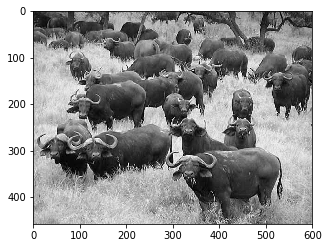

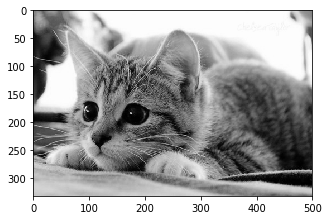

In [9]:
grbizon = to_gray(bizon.copy())
grmeow = to_gray(meow.copy())
plt.figure(figsize=(5, 5))
plt.imshow(grbizon, cmap='gray')
plt.figure(figsize=(5, 5))
plt.imshow(grmeow, cmap='gray')

Спектральная кластеризация (основана на [примере в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html)) и визуализация результатов.

По умолчанию, размер изображения уменьшается для ускорения работы алгоритма.

In [10]:
def cluster(img, n_regions=8, do_resize=True):
    print('Performing spectral clustering...\nResize image: {}\nN regions: {}'
          .format(do_resize, n_regions))
    size = (int(img.shape[0]*0.25), int(img.shape[1]*0.25))
    if do_resize:
        img = resize(img, size, mode='reflect')
    graph = image.img_to_graph(img)
    beta = 5
    eps = 1e-6
    graph.data = np.exp(-beta * graph.data / graph.data.std()) + eps
    for assign_labels in ('kmeans', 'discretize'):
        t0 = time.time()
        labels = spectral_clustering(graph, n_clusters=n_regions,
                                 assign_labels=assign_labels, random_state=1)
        t1 = time.time()
        labels = labels.reshape(img.shape)
        plt.figure(figsize=(5, 5))
        plt.imshow(img, cmap='gray')
        for l in range(n_regions):
            plt.contour(labels == l, colors=[plt.cm.spectral(l / float(n_regions))])
        plt.xticks(())
        plt.yticks(())
        title = 'Spectral clustering: %s, %.2fs' % (assign_labels, (t1 - t0))
        print(title)
        plt.title(title)
    plt.show()

Воспользуемся описанной выше функцией:

Performing spectral clustering...
Resize image: True
N regions: 8
Spectral clustering: kmeans, 8.63s
Spectral clustering: discretize, 7.08s


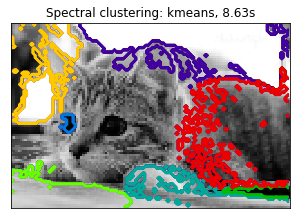

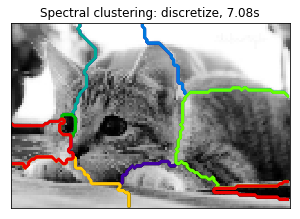

In [11]:
cluster(grmeow)

Performing spectral clustering...
Resize image: True
N regions: 20
Spectral clustering: kmeans, 18.26s
Spectral clustering: discretize, 17.01s


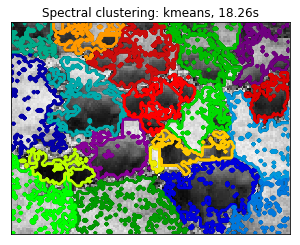

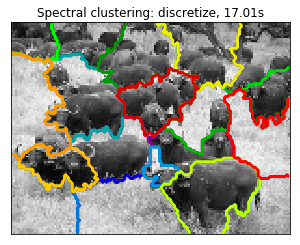

In [12]:
cluster(grbizon, 20)

---

**5. (1 балл)** Поэкспериментируйте с параметрами алгоритмов и параметром $\lambda$ в признаках. Сравните два метода сегментации.

**6. (0.5 балл)**
Насколько хорошо выделяются объекты на изображениях?

In [13]:
def test(img, nrange, lambdas):
    print('Clustering with kmeans...')
    for n in nrange:
        for l in lambdas:
            km_cluster(img, l, n)
    
    print('-------------\nSpectral clustering...')
    grimg = to_gray(img.copy())
    for n in nrange:
        cluster(grimg, n_regions=n)
        

Clustering with kmeans...


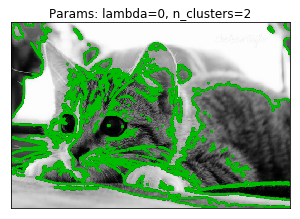

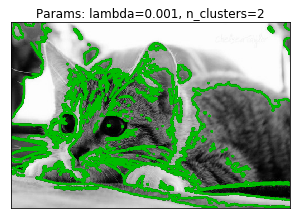

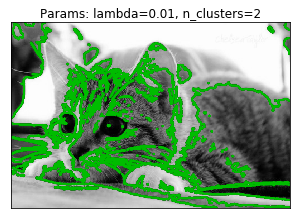

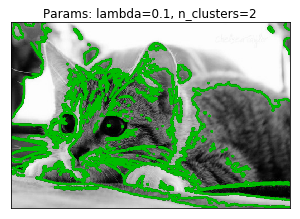

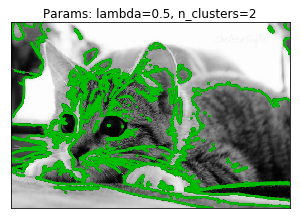

...

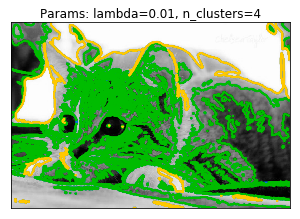

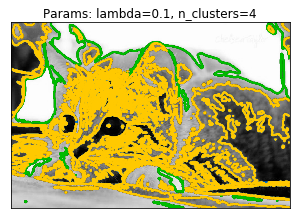

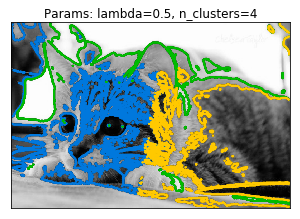

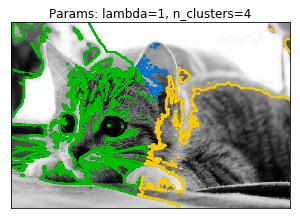

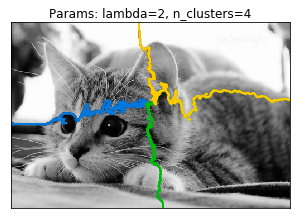

-------------
Spectral clustering...
Performing spectral clustering...
Resize image: True
N regions: 2
Spectral clustering: kmeans, 173.97s
Spectral clustering: discretize, 176.09s


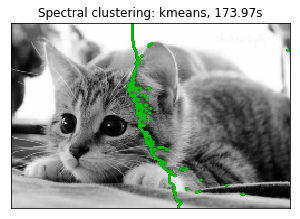

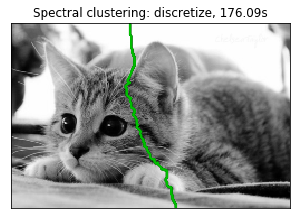

Performing spectral clustering...
Resize image: True
N regions: 3
Spectral clustering: kmeans, 110.16s
Spectral clustering: discretize, 114.71s


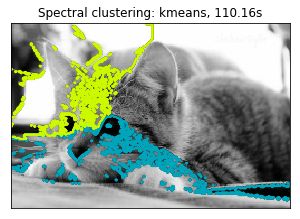

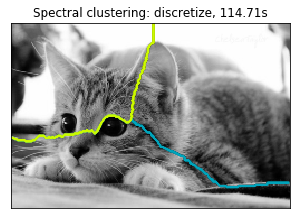

Performing spectral clustering...
Resize image: True
N regions: 4
Spectral clustering: kmeans, 88.05s
Spectral clustering: discretize, 80.69s


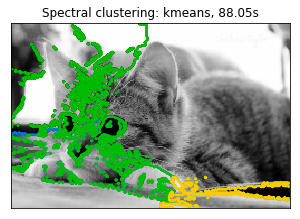

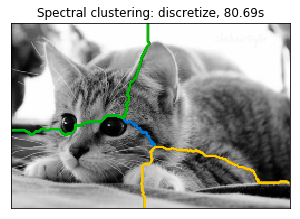

In [200]:
lambdas = [0, 0.001, 0.01, 0.1, 0.5, 1, 2]
test(meow, range(2,5), lambdas)

При слишком маленьких $\lambda$ на изображении выделяются сегменты, соответствующие определенному цвету, а при слишком больших (>1) изображение просто разделяется на несколько частей. Поэтому будем использовать $\lambda$ = 0.5 в дальнеших тестах.

Clustering with kmeans...


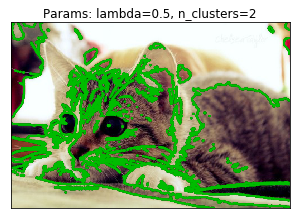

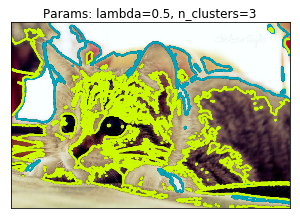

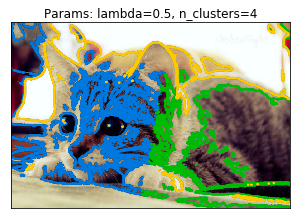

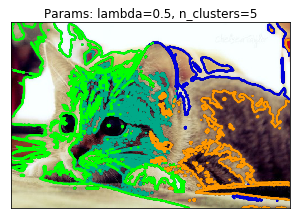

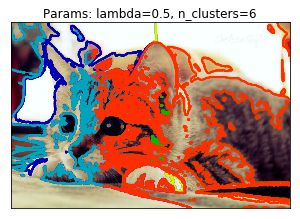

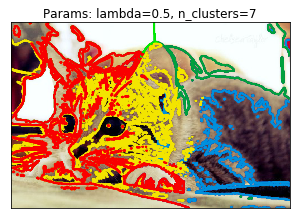

-------------
Spectral clustering...
Performing spectral clustering...
Resize image: True
N regions: 2
Spectral clustering: kmeans, 18.87s
Spectral clustering: discretize, 20.63s


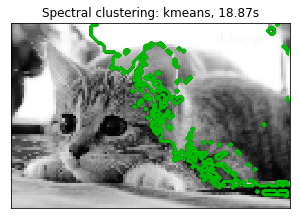

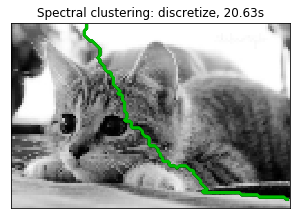

Performing spectral clustering...
Resize image: True
N regions: 3
Spectral clustering: kmeans, 12.38s
Spectral clustering: discretize, 10.45s


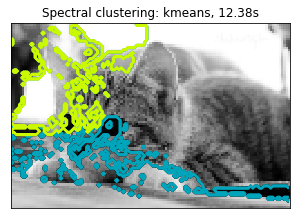

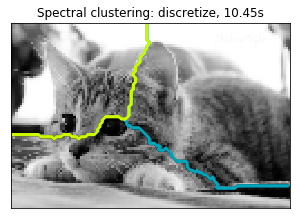

Performing spectral clustering...
Resize image: True
N regions: 4
Spectral clustering: kmeans, 8.64s
Spectral clustering: discretize, 10.58s


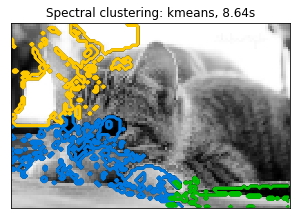

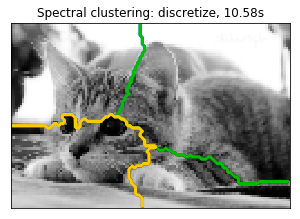

Performing spectral clustering...
Resize image: True
N regions: 5
Spectral clustering: kmeans, 10.51s
Spectral clustering: discretize, 11.92s


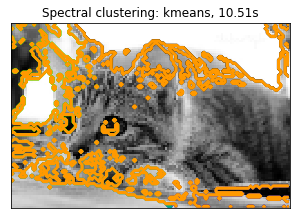

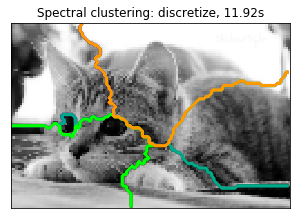

Performing spectral clustering...
Resize image: True
N regions: 6
Spectral clustering: kmeans, 9.95s
Spectral clustering: discretize, 9.03s


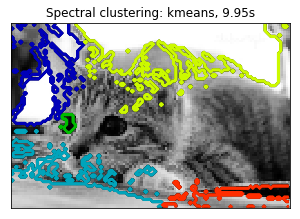

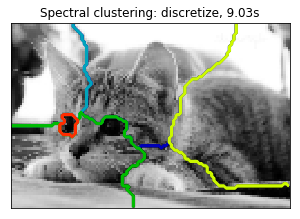

Performing spectral clustering...
Resize image: True
N regions: 7
Spectral clustering: kmeans, 7.96s
Spectral clustering: discretize, 9.16s


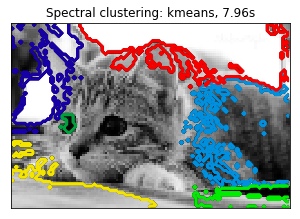

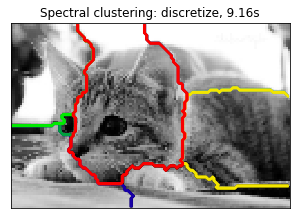

In [18]:
test(meow, range(2,8), [0.5])

Clustering with kmeans...


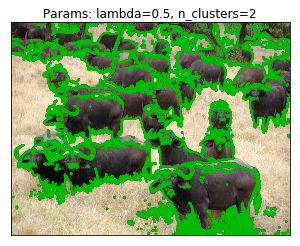

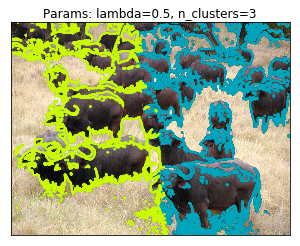

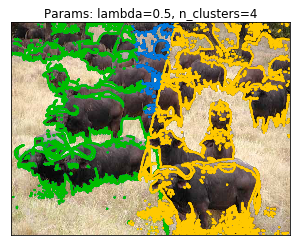

-------------
Spectral clustering...
Performing spectral clustering...
Resize image: True
N regions: 2
Spectral clustering: kmeans, 88.47s
Spectral clustering: discretize, 86.18s


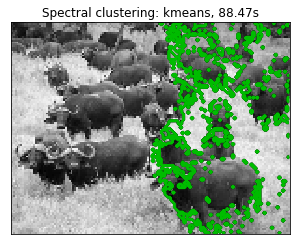

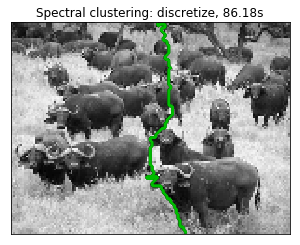

Performing spectral clustering...
Resize image: True
N regions: 3
Spectral clustering: kmeans, 53.06s
Spectral clustering: discretize, 57.99s


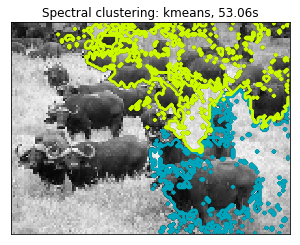

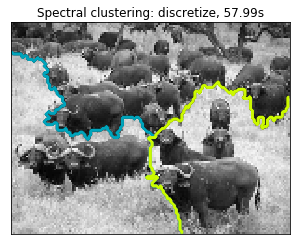

Performing spectral clustering...
Resize image: True
N regions: 4
Spectral clustering: kmeans, 40.05s
Spectral clustering: discretize, 47.76s


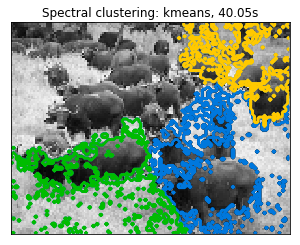

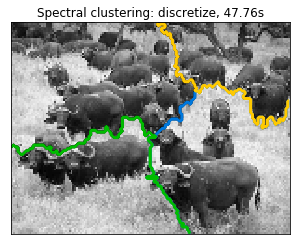

In [19]:
test(bizon, [2,3,4], [0.5])

Clustering with kmeans...


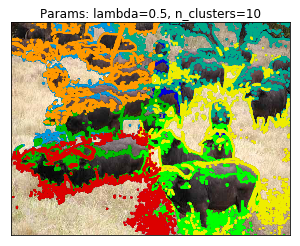

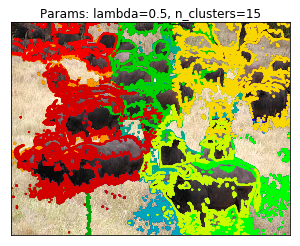

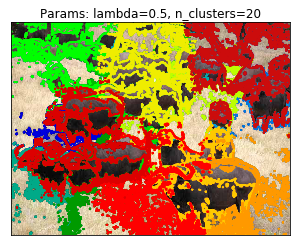

-------------
Spectral clustering...
Performing spectral clustering...
Resize image: True
N regions: 10
Spectral clustering: kmeans, 50.84s
Spectral clustering: discretize, 56.33s


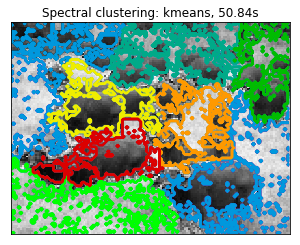

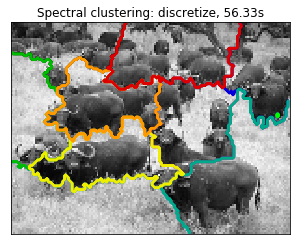

Performing spectral clustering...
Resize image: True
N regions: 15
Spectral clustering: kmeans, 21.09s
Spectral clustering: discretize, 21.13s


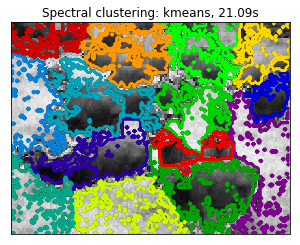

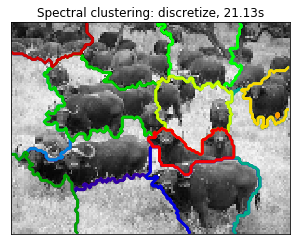

Performing spectral clustering...
Resize image: True
N regions: 20
Spectral clustering: kmeans, 19.78s
Spectral clustering: discretize, 16.09s


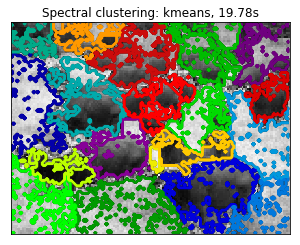

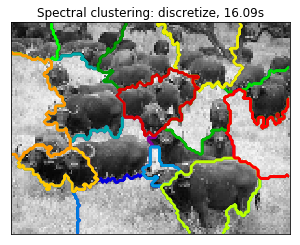

In [20]:
test(bizon, [10,15,20], [0.5])

Вывод:

Первым методом объекты выделяются значительно быстрее и точнее на меньшем количестве кластеров. Спектральная требует существенно больше времени (даже для сжатых изображений, приведенных к серому цвету), но если требуется выделить больше различных объектов, то на большом количестве кластеров результат ее работы будет лучше. 

### Алгоритм спектральной кластеризации
[статья](http://people.eecs.berkeley.edu/~malik/papers/SM-ncut.pdf)

* определить матрицу сходства $A$, используя Гауссово ядрор $K$ ($A_{i,j}\sim exp(-\alpha \Vert x_{i}-x_{j}\Vert^{2}) $) или просто матрице смежности (например $A_{i,j}=\delta_{i,j}$),
* построить лапласиан по $A$, например $L=D-A$ - простой, $L_{N}=D^{-1/2}LD^{-1/2}$ - нормализованный, где $D_{i,i}=\sum^{n}_{j}a_{i,j}$ - диагональная матрица,
* свойство лапласиана - $x^{T}Lx=\frac{1}{2}\sum_{i,j=1}^{n}w_{i,j}\Vert x_{i}-x_{j}\Vert^{2}$,
* найти собственные значения $L v=\lambda v$   (или решить обобщенную задачу $L v=\lambda D v$ )
* выбрать $k$ собтвенных векторов $\{ v_{i}, i=1, k \}$, соответствующих $k$ наименьшим (или наибольшим) собственным значениям  $\{ \lambda_{i}, i=1, k \}$ , и задать $k$-мерное подпространство $P^{T}LP$,
* найти кластеры в этом подпространстве.

---

**7. (2 доп. балла)** Визуализируйте первые несколько собственных векторов, соответствующие самым маленьким собственным числам.
Для этого вам надо более детально ознакомиться с тем, как  работает алгоритм (см. [статью](http://people.eecs.berkeley.edu/~malik/papers/SM-ncut.pdf)).

Вам может помочь [исходный код sklearn](https://github.com/scikit-learn/scikit-learn/blob/a24c8b46/sklearn/manifold/spectral_embedding_.py#L133) и функции из scipy: eigh, eigsh, lobpcg.

---

По умолчанию, функция spectral_embedding не возвращает собственные значения - только векторы. Чтобы получить их, следует изменить немного функцию, включив в возвращаемые значения переменную lambdas, содержащую данные значения. Таким образом, на выходе функции будем иметь и векторы, и значения.

In [10]:
def set_diag(laplacian, value, norm_laplacian):
    n_nodes = laplacian.shape[0]
    # We need all entries in the diagonal to values
    from scipy.sparse import isspmatrix
    if not isspmatrix(laplacian):
        if norm_laplacian:
            laplacian.flat[::n_nodes + 1] = value
    else:
        laplacian = laplacian.tocoo()
        if norm_laplacian:
            diag_idx = (laplacian.row == laplacian.col)
            laplacian.data[diag_idx] = value
        # If the matrix has a small number of diagonals (as in the
        # case of structured matrices coming from images), the
        # dia format might be best suited for matvec products:
        n_diags = np.unique(laplacian.row - laplacian.col).size
        if n_diags <= 7:
            # 3 or less outer diagonals on each side
            laplacian = laplacian.todia()
        else:
            # csr has the fastest matvec and is thus best suited to
            # arpack
            laplacian = laplacian.tocsr()
    return laplacian

def make_embedding(adjacency, n_components=8, eigen_solver=None,
                       random_state=None, eigen_tol=0.0,
                       norm_laplacian=True, drop_first=True):
    
    from sklearn.utils import check_symmetric, check_random_state, check_array
    from sklearn.utils.extmath import _deterministic_vector_sign_flip
    from pyamg import smoothed_aggregation_solver
    from scipy.sparse.csgraph import laplacian
    from scipy.sparse.linalg import eigsh, lobpcg
    from scipy.sparse import isspmatrix
    
    adjacency = check_symmetric(adjacency)

    
    random_state = check_random_state(random_state)

    n_nodes = adjacency.shape[0]
    # Whether to drop the first eigenvector
    if drop_first:
        n_components = n_components + 1

    laplacian, dd = laplacian(adjacency, normed=norm_laplacian, return_diag=True)

    laplacian = check_array(laplacian, dtype=np.float64, accept_sparse=True)
    laplacian = set_diag(laplacian, 1, norm_laplacian)
    ml = smoothed_aggregation_solver(check_array(laplacian, 'csr'))
    M = ml.aspreconditioner()
    X = random_state.rand(laplacian.shape[0], n_components + 1)
    X[:, 0] = dd.ravel()
    lambdas, diffusion_map = lobpcg(laplacian, X, M=M, tol=1.e-12, largest=False)
    embedding = diffusion_map.T * dd
    if embedding.shape[0] == 1:
        raise ValueError
    embedding = _deterministic_vector_sign_flip(embedding)
    if drop_first:
        return embedding[1:n_components].T, lambdas[1:n_components]
    else:
        return embedding[:n_components].T, lambdas[:n_components]

In [11]:
def get_eigen(img, n_regions=8, do_resize=True):
    size = (int(img.shape[0]*0.25), int(img.shape[1]*0.25))
    print(size)
    if do_resize:
        img = resize(img, size, mode='reflect')
    graph = image.img_to_graph(img)
    beta = 5
    eps = 1e-6
    graph.data = np.exp(-beta * graph.data / graph.data.std()) + eps
    
    maps, lambdas = make_embedding(graph, n_components=n_regions, random_state=1, drop_first=False)
    return lambdas, maps

In [16]:
vals, v = get_eigen(grmeow)

(83, 125)


In [17]:
vals

array([  3.59560253e-17,   8.80274015e-05,   1.12728799e-04,
         2.39093436e-04,   3.48081449e-04,   3.68246966e-04,
         4.34158197e-04,   4.53756626e-04])

In [18]:
v

array([[ 0.01106455,  0.00995756, -0.02317859, ..., -0.01821763,
         0.0073166 ,  0.02037616],
       [ 0.01708832,  0.01536393, -0.03577379, ..., -0.0280573 ,
         0.01126587,  0.03138697],
       [ 0.01082117,  0.00971412, -0.02262874, ..., -0.01768641,
         0.00709855,  0.01978868],
       ..., 
       [ 0.00660733,  0.00376508,  0.01447614, ...,  0.00916029,
         0.00765138,  0.00626611],
       [ 0.00792291,  0.00451542,  0.01736801, ...,  0.01100518,
         0.00919992,  0.00752055],
       [ 0.00505416,  0.00288052,  0.01108074, ...,  0.00702357,
         0.00587271,  0.00479882]])

In [19]:
vecs = {}
for i in range(len(vals)):
    vecs[vals[i]] = v[:, i]

In [20]:
sorted(vecs.keys())

[3.5956025299328294e-17,
 8.802740152266271e-05,
 0.00011272879850904369,
 0.00023909343627530414,
 0.00034808144881183045,
 0.0003682469656310059,
 0.00043415819682094602,
 0.00045375662580982105]

Попробуем визуализировать первые 5:

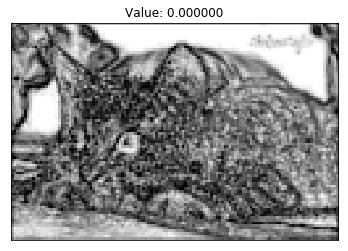

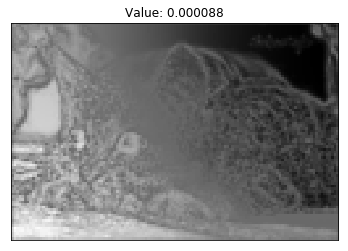

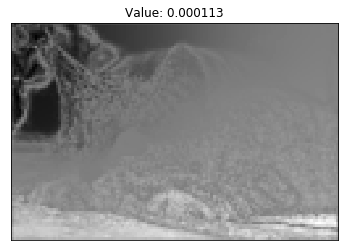

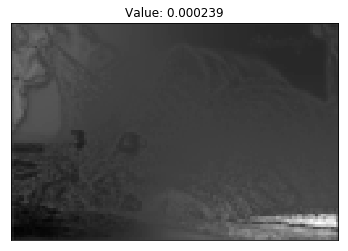

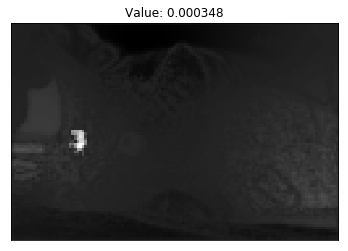

In [21]:
for k in sorted(vecs.keys())[:5]:
    title = 'Value: {:4f}'.format(k)
    plt.imshow(np.reshape(vecs[k], (83, 125)), cmap='gray')
    plt.xticks(())
    plt.yticks(())
    plt.title(title)
    plt.show()

---

## Сжатие информации с помощью SVD

Выберите любую из картинок.
Приведите ее к серому цвету.

Чёрно-белая картинка - матрица, элементы которой - насыщенность серого цвета каждого из пикселей.

**Замечание.** Главные компоненты - это не скрытые признаки, а матрицы вида $u^{(i)}\sigma_i(v^{(i)})^T$, где $u^{(i)}, v^{(i)}$ --- столбцы матриц $U$ и $V$ соответственно. В частности, сумма первых нескольких главных компонент --- это наилучшее приближение исходной матрицы матрицей данного ранга.


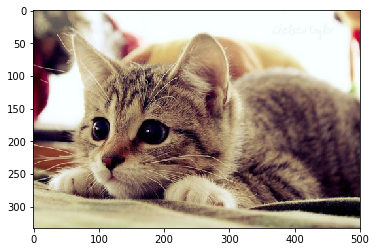

In [21]:
img = imageio.imread('data/meow.jpg')
plt.imshow(img)

**8. (1 балл)** Постройте сингулярное разложение этой матрицы (не центрируя данные). 

**9. (1 балл)** Визуализуйте первую главную компоненту. Что получилось? Почему?

**10. (0.5 балл)** Визуализуйте компоненты с первой по двадцатую, с первой по пятидесятую, с двадцатой по сотую, с двадцатой по последнюю. Что получилось и почему?
Сколько первых компонент нужно взять для достаточно хорошего восстановления исходного изображения?

**11. (0.5 балл)** Как изменится результат, если сначала вы центрируете данные?



Вспомогательная функция для визуализации главных компонент. По умолчанию визуализирует первую.

In [22]:
def display_c(U, sigma, V, start=1, stop=1, step=1):
    if stop==1 and start > 1:
        stop=len(sigma)
        
    for i in range(start, stop+1, step):
        reconstimg = np.matrix(U[:, :i]) * np.diag(sigma[:i]) * np.matrix(V[:i, :])
        plt.imshow(reconstimg, cmap='gray')
        title = "n = %s" % i
        plt.xticks(())
        plt.yticks(())
        plt.title(title)
        plt.show()

Построим сингулярное разложение:

In [23]:
U, sigma, V = np.linalg.svd(to_gray(img.copy()))

Визуализируем только первую главную компоненту:

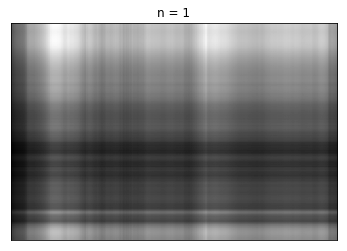

In [24]:
display_c(U, sigma, V)

На полученном изображении наиболее темные участки ближе к центру характеризиуют местоположение нашего котика.

Визуализируем с первой по двадцатую:

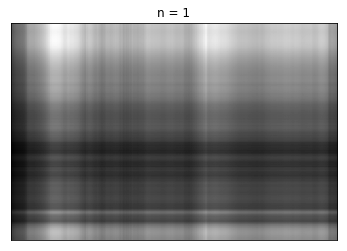

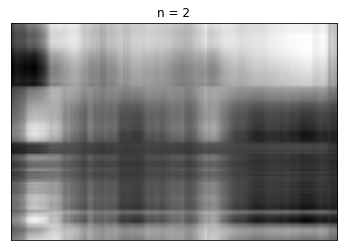

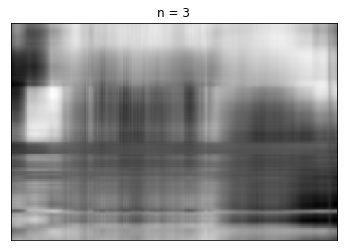

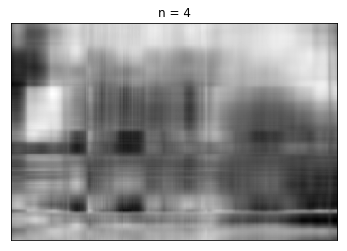

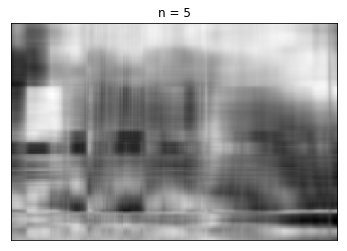

...

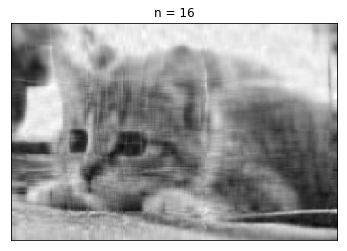

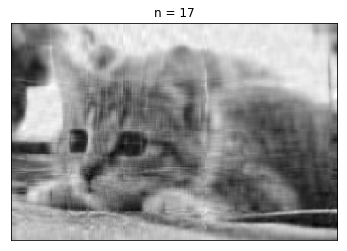

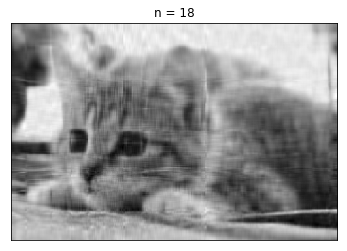

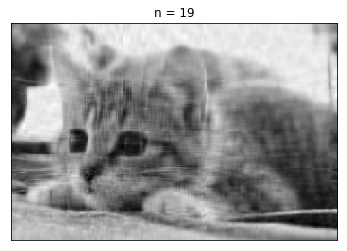

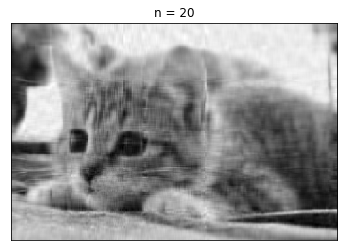

In [25]:
display_c(U, sigma, V, stop=20)

С первой по пятидесятую:

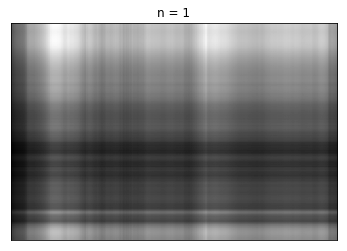

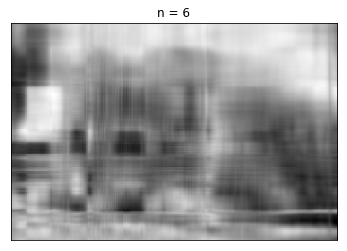

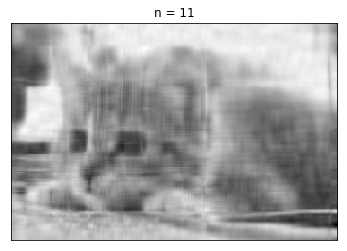

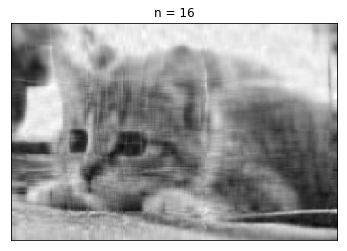

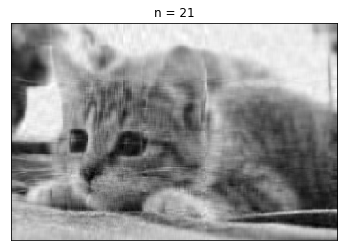

...

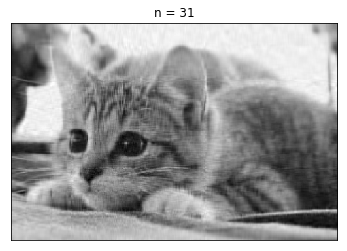

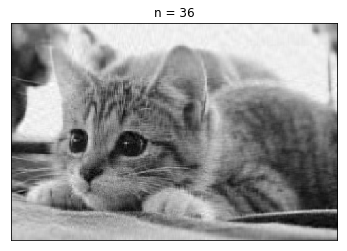

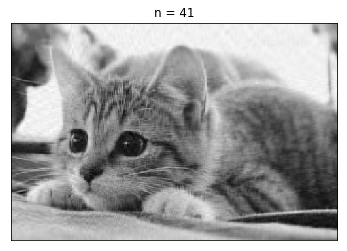

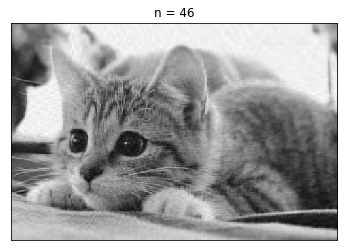

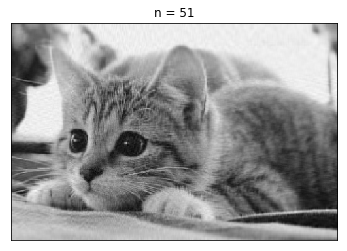

In [26]:
display_c(U, sigma, V, stop=51, step=5)

С двадцатой по сотую:

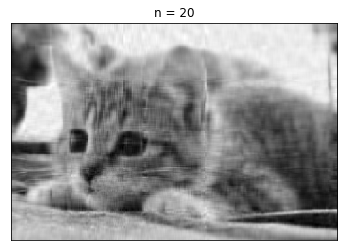

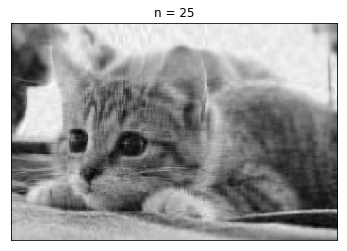

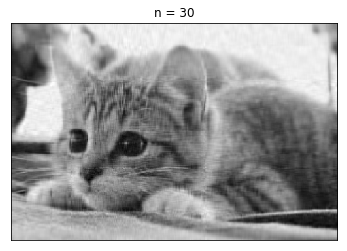

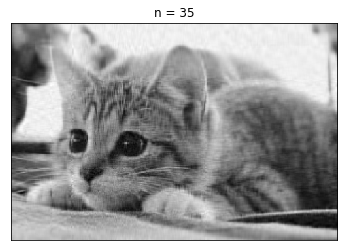

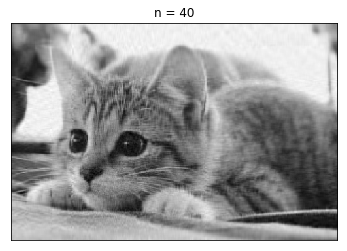

...

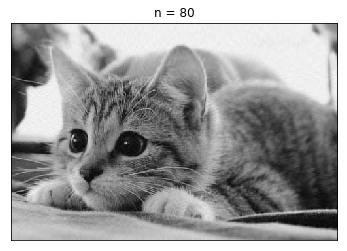

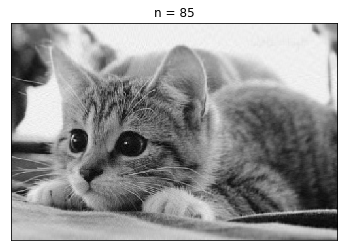

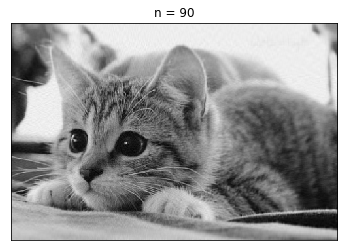

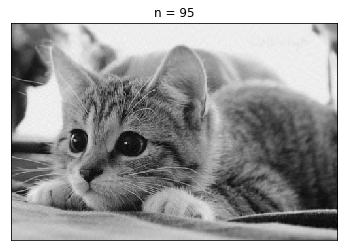

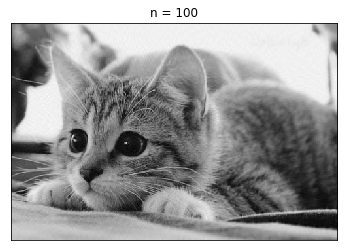

In [27]:
display_c(U, sigma, V, start=20, stop=100, step=5)

С двадцатой по последнюю (сделаем шаг в 10, т.к. разница в визуализации будет более наглядной):

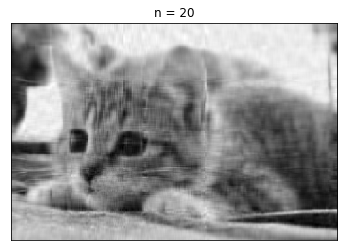

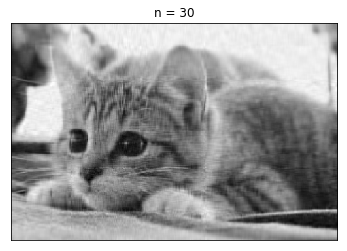

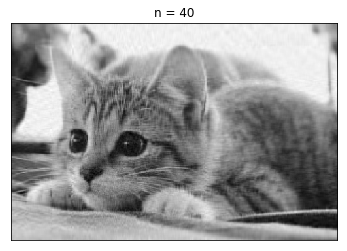

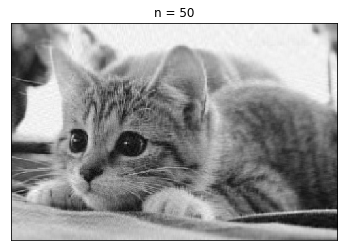

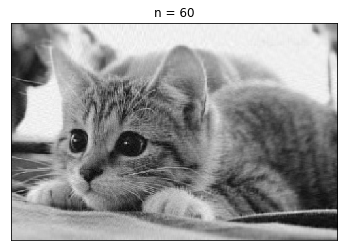

...

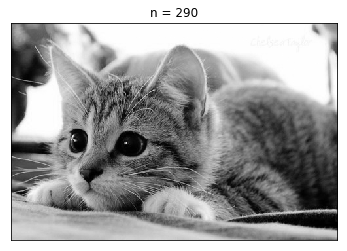

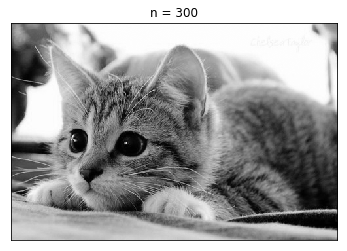

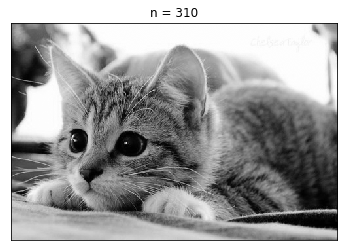

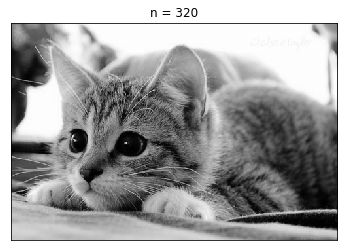

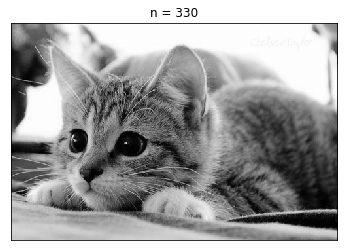

In [28]:
display_c(U, sigma, V, start=20, stop=len(sigma), step=10)

Как видно выше, 4 компоненты дают нам очертания котика, а при 5 уже его можно различать. При 20 котик уже полностью виден, однако качество изображения крайне низкое. Продолжая увеличивать число компонент, обратим внимание, что приблизительно при 55 компонентах котик достаточно хорошо восстановлен. При сотне он уже восстановлен отлично (разница в качестве почти незаметна) и с увеличением числа компонент заметных улучшений в качестве не наблюдается, однако размер изображения растет.

Таким образом, для хорошего качества достаточно примерно 55 первых компонент, а для отличного - 100.

А теперь центрируем данные и попробуем проделать то же самое:

In [29]:
def center(matrix):
    m = matrix.mean(axis=1)
    return matrix - m

In [31]:
centered = center(np.matrix(to_gray(img.copy())))

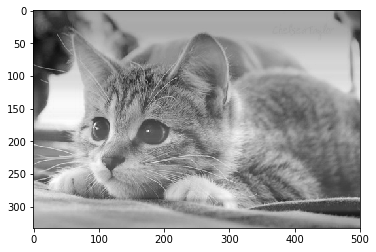

In [32]:
plt.imshow(centered, cmap='gray')

In [33]:
U_c, sigma_c, V_c = np.linalg.svd(centered)

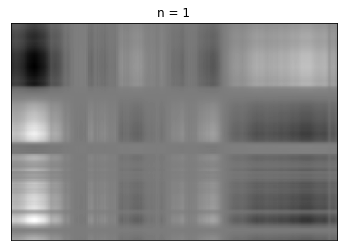

In [34]:
display_c(U_c, sigma_c, V_c)

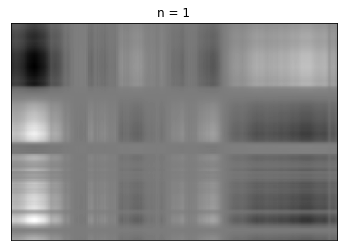

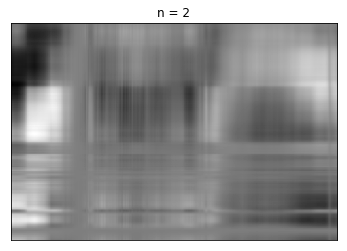

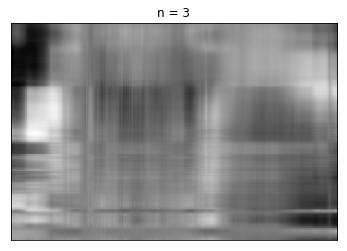

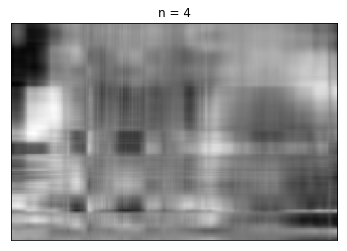

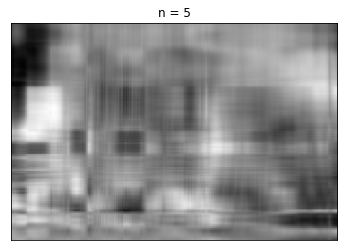

...

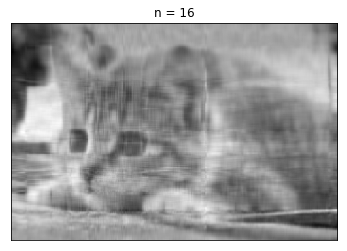

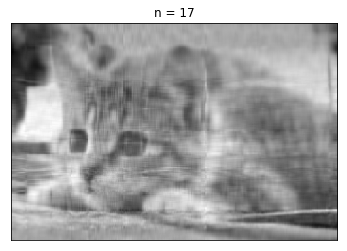

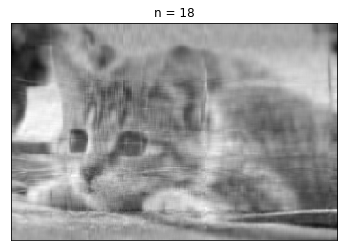

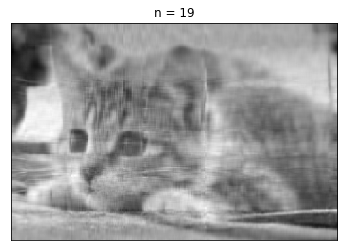

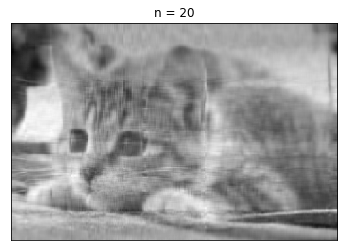

In [35]:
display_c(U_c, sigma_c, V_c, stop=20)

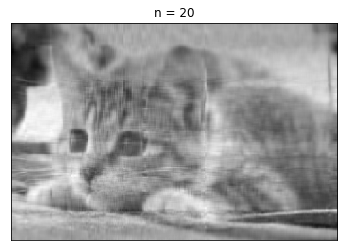

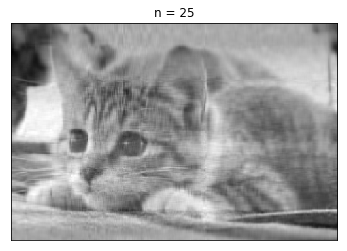

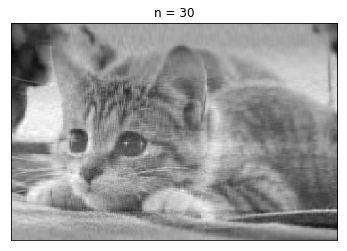

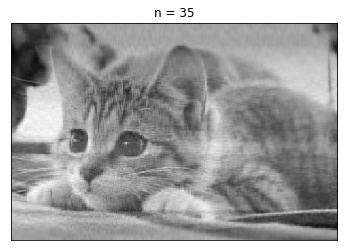

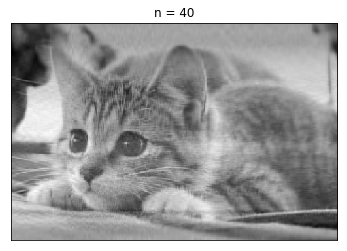

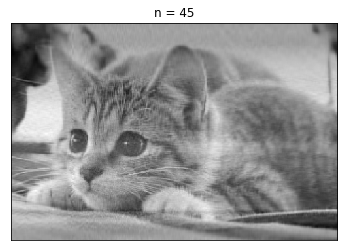

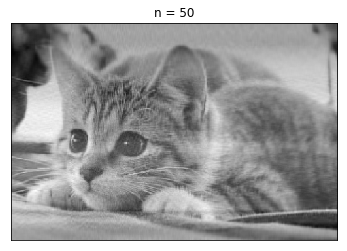

In [36]:
display_c(U_c, sigma_c, V_c, start=20, stop=50, step=5)

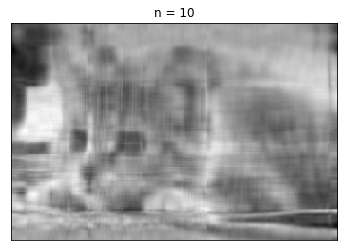

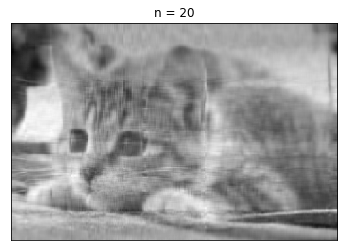

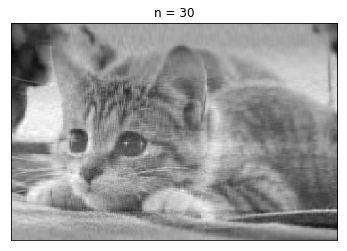

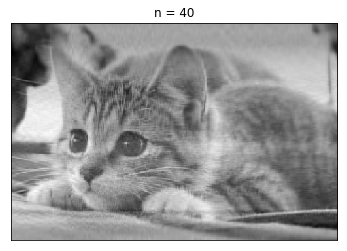

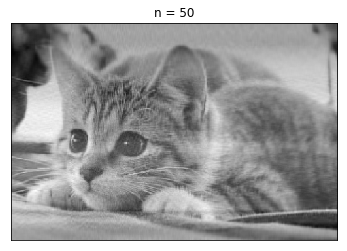

...

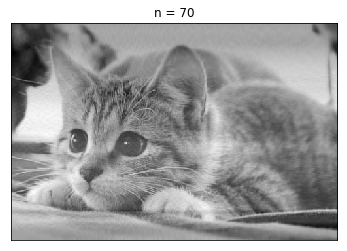

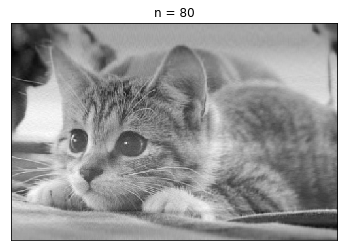

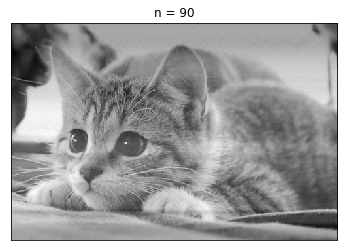

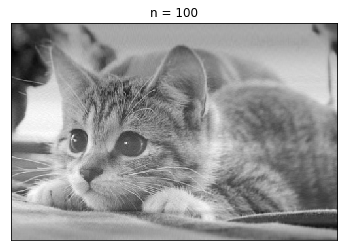

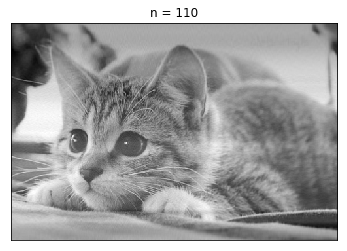

In [37]:
display_c(U_c, sigma_c, V_c, start=10, stop=110, step=10)

Изображение стало менее ярким, но зато теперь меньшее количество компонент требуется для восстановления до хорошего качества.